In [2]:
import pandas as pd
from itables import show
import numpy as np
import pandas as pd

from pycaret.time_series import TSForecastingExperiment

import seaborn as sns
import warnings
import os

%matplotlib inline
os.environ["PYCARET_CUSTOM_LOGGING_LEVEL"] = "CRITICAL"
warnings.filterwarnings(action="ignore")


# Lendo e tratando os dados

In [3]:
# Lê os dados de entrada
df = pd.read_csv("../../data/Ibovespa_20100101-20240224.csv")
show(df)


In [4]:
# corrige os tipos de dados
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3503 entries, 0 to 3502
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Data      3503 non-null   object 
 1   Último    3503 non-null   float64
 2   Abertura  3503 non-null   float64
 3   Máxima    3503 non-null   float64
 4   Mínima    3503 non-null   float64
 5   Vol.      3502 non-null   object 
 6   Var%      3503 non-null   object 
dtypes: float64(4), object(3)
memory usage: 191.7+ KB


In [5]:
def vol_to_numeric_value(s: str) -> float:
    """
    Transforma o valor de volume em float

    Args:
        s (str): valor de volume

    Returns:
        float: valor de volume em float
    """
    # if contains M, then multiply by 1.000.000
    if "M" in s:
        return float(s.replace("M", "")) * 1_000_000
    # if contains B, then multiply by 1.000.000.000
    elif "B" in s:
        return float(s.replace("B", "")) * 1_000_000_000
    elif "K" in s:
        return int(float(s.replace("K", ""))) * 1_000
    else:
        return np.nan


# corrige os tipos de dados
df["Data"] = pd.to_datetime(df["Data"])
df["Vol."] = df["Vol."].apply(lambda x: vol_to_numeric_value(str(x).replace(",", ".")))
df["Var%"] = df["Var%"].apply(lambda x: float(x.replace(",", ".").split("%")[0]) / 100)
df.set_index("Data", inplace=True)


In [6]:
df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3503 entries, 2024-02-23 to 2010-01-04
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Último    3503 non-null   float64
 1   Abertura  3503 non-null   float64
 2   Máxima    3503 non-null   float64
 3   Mínima    3503 non-null   float64
 4   Vol.      3502 non-null   float64
 5   Var%      3503 non-null   float64
dtypes: float64(6)
memory usage: 191.6 KB


# EDA

In [7]:
cm = sns.light_palette("gray", as_cmap=True)
df.head(20).style.background_gradient(cmap=cm)


,Último,Abertura,Máxima,Mínima,Vol.,Var%
Data,,,,,,
2024-02-23 00:00:00,129.419000,130.240000,130.624000,129.077000,9230000.000000,-0.006300
2024-02-22 00:00:00,130.241000,130.035000,130.829000,129.971000,10770000.000000,0.001600
2024-02-21 00:00:00,130.032000,129.916000,130.034000,129.359000,12590000.000000,0.000900
2024-02-20 00:00:00,129.916000,129.033000,129.916000,128.326000,12240000.000000,0.006800
2024-02-19 00:00:00,129.036000,128.720000,129.036000,128.097000,5800000.000000,0.002400
2024-02-16 00:00:00,128.726000,127.809000,129.069000,127.653000,10120000.000000,0.007200
2024-02-15 00:00:00,127.804000,127.018000,127.824000,126.932000,10980000.000000,0.006200
2024-02-14 00:00:00,127.018000,128.026000,128.026000,126.663000,7750000.000000,-0.007900
2024-02-09 00:00:00,128.026000,128.216000,128.896000,127.579000,12120000.000000,-0.001500


In [8]:
df.head()


,Último,Abertura,Máxima,Mínima,Vol.,Var%
Data,,,,,,
2024-02-23,129.419,130.240,130.624,129.077,9230000.0,-0.0063
2024-02-22,130.241,130.035,130.829,129.971,10770000.0,0.0016
2024-02-21,130.032,129.916,130.034,129.359,12590000.0,0.0009
2024-02-20,129.916,129.033,129.916,128.326,12240000.0,0.0068
2024-02-19,129.036,128.720,129.036,128.097,5800000.0,0.0024


In [9]:
df.tail()


,Último,Abertura,Máxima,Mínima,Vol.,Var%
Data,,,,,,
2010-01-08,70.263,70.455,70.766,70.158,1630000.0,-0.0027
2010-01-07,70.451,70.723,70.723,70.045,1550000.0,-0.0039
2010-01-06,70.729,70.237,70.937,70.016,2240000.0,0.0070
2010-01-05,70.240,70.046,70.595,69.928,1980000.0,0.0028
2010-01-04,70.045,68.587,70.081,68.587,1660000.0,0.0212


In [10]:
close_df = df[["Último"]]  # Select the "Close" column
close_df.rename(columns={"Último": "Close"}, inplace=True)
close_df = close_df.asfreq("d")
# close_df = close_df.asfreq("M")
close_df.fillna(method="ffill", inplace=True)


In [11]:
close_df = close_df.loc["2018-01-01":]


In [12]:
close_df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2245 entries, 2018-01-01 to 2024-02-23
Freq: D
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   2245 non-null   float64
dtypes: float64(1)
memory usage: 35.1 KB


In [13]:
print(close_df.head())
print(close_df.tail())


             Close
Data              
2018-01-01  76.402
2018-01-02  77.891
2018-01-03  77.995
2018-01-04  78.647
2018-01-05  79.071
              Close
Data               
2024-02-19  129.036
2024-02-20  129.916
2024-02-21  130.032
2024-02-22  130.241
2024-02-23  129.419


In [14]:
close_df.describe()


,Close
count,2245.000000
mean,104.304033
std,14.722484
min,63.570000
25%,95.479000
50%,106.042000
75%,115.313000
max,134.194000


<Axes: xlabel='Data'>

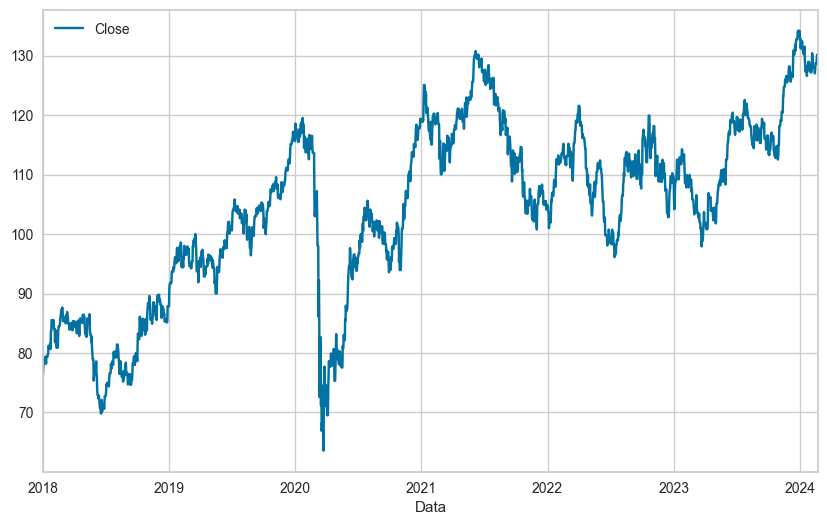

In [15]:
close_df.plot(figsize=(10, 6))


In [16]:
# parâmetros para o modelo
fh = 220
fold = 5
fig_kwargs = {
    "rederer": "png",  # png ou svg
    "height": 600,  # altura da imagem
    "width": 1000,
    "template": "simple_white",
}
exp = TSForecastingExperiment()

exp.setup(
    data=close_df,
    fh=fh,
    session_id=42,
    fig_kwargs=fig_kwargs,
    use_gpu=True,
    fold=fold,
)


,Description,Value
0,session_id,42
1,Target,Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(2245, 1)"
5,Transformed data shape,"(2245, 1)"
6,Transformed train set shape,"(2025, 1)"
7,Transformed test set shape,"(220, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3070 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there a

In [17]:
from sklearn.metrics import mean_squared_error, f1_score

exp.add_metric("mean_squared_error", "MSE", mean_squared_error, greater_is_better=False)
exp.add_metric("f1_score", "f1_score", f1_score, greater_is_better=False)


Name                                                          f1_score
Display Name                                                  f1_score
Score Function               <function f1_score at 0x0000014BD5F34680>
Scorer               make_scorer(f1_score, greater_is_better=False,...
Target                                                            pred
Args                                                                {}
Greater is Better                                                False
Custom                                                            True
Name: f1_score, dtype: object

# Checando a série de tempo

## Dividindo conjunto entre Treino e Teste

In [18]:
exp.plot_model(plot="train_test_split", fig_kwargs=fig_kwargs)


In [19]:
exp.plot_model(plot="cv", fig_kwargs={"height": 900, "width": 900})


In [20]:
exp.plot_model(plot="diagnostics", fig_kwargs={"height": 800, "width": 1000})


In [21]:
exp.plot_model(
    plot="diff",
    data_kwargs={
        "lags_list": [[1], [1, 30]],
        "acf": True,
        "pacf": True,
        "periodogram": True,
    },
    fig_kwargs={"height": 800, "width": 1500},
)


In [22]:
exp.plot_model(plot="decomp", fig_kwargs={"height": 500})


In [23]:
# Users may wish to customize the decomposition, for example, in this case multiplicative seasonality
# probably makes more sense since the magnitide of the seasonality increase as the time progresses
exp.plot_model(
    plot="decomp",
    data_kwargs={"type": "multiplicative", "seasonal_period": 180},
    fig_kwargs={"height": 500},
)


# Statistical tests

In [24]:
exp.check_stats()


,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,2245.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,104.304033
3,Summary,Statistics,Transformed,Median,,106.042
4,Summary,Statistics,Transformed,Standard Deviation,,14.722484
5,Summary,Statistics,Transformed,Variance,,216.751534
6,Summary,Statistics,Transformed,Kurtosis,,-0.56507
7,Summary,Statistics,Transformed,Skewness,,-0.402181
8,Summary,Statistics,Transformed,# Distinct Values,,1500.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",47861.176532


In [25]:
close_diff = exp.data.diff().dropna()
close_diff.head()


,Close
Data,
2018-01-02,1.489
2018-01-03,0.104
2018-01-04,0.652
2018-01-05,0.424
2018-01-06,0.000


In [26]:
exp2 = TSForecastingExperiment()
exp2.setup(
    data=close_diff,
    fh=fh,
    session_id=42,
    fig_kwargs=fig_kwargs,
    use_gpu=True,
    fold=fold,
)


,Description,Value
0,session_id,42
1,Target,Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(2244, 1)"
5,Transformed data shape,"(2244, 1)"
6,Transformed train set shape,"(2024, 1)"
7,Transformed test set shape,"(220, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3070 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there a

In [27]:
exp2.plot_model(plot="diagnostics", fig_kwargs={"height": 800, "width": 1000})


In [28]:
exp2.check_stats()


,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,2244.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,0.023626
3,Summary,Statistics,Transformed,Median,,0.0
4,Summary,Statistics,Transformed,Standard Deviation,,1.267506
5,Summary,Statistics,Transformed,Variance,,1.606572
6,Summary,Statistics,Transformed,Kurtosis,,15.424943
7,Summary,Statistics,Transformed,Skewness,,-1.213565
8,Summary,Statistics,Transformed,# Distinct Values,,1375.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",52.414542


# Modelo

In [29]:
exp.get_metrics()


,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Custom
ID,,,,,,,,
mase,MASE,MASE,<function mase at 0x0000014BD789C9A0>,"make_scorer(mase, greater_is_better=False, res...",pred,{},False,False
rmsse,RMSSE,RMSSE,<function rmsse at 0x0000014BD789CA40>,"make_scorer(rmsse, greater_is_better=False, re...",pred,{},False,False
mae,MAE,MAE,<function mean_absolute_error at 0x0000014BD5F...,neg_mean_absolute_error,pred,{},False,False
rmse,RMSE,RMSE,<function mean_squared_error at 0x0000014BD5F5...,neg_root_mean_squared_error,pred,{'squared': False},False,False
mape,MAPE,MAPE,<function mape at 0x0000014BD789C900>,"make_scorer(mape, greater_is_better=False, res...",pred,{},False,False
smape,SMAPE,SMAPE,<function _smape_loss at 0x0000014BD781B560>,"make_scorer(_smape_loss, greater_is_better=Fal...",pred,{},False,False
r2,R2,R2,<function r2_score at 0x0000014BD5F5DC60>,r2,pred,{},True,False
mean_squared_error,MSE,MSE,<function mean_squared_error at 0x0000014BD5F5...,"make_scorer(mean_squared_error, greater_is_bet...",pred,{},False,True
f1_score,f1_score,f1_score,<function f1_score at 0x0000014BD5F34680>,"make_scorer(f1_score, greater_is_better=False,...",pred,{},False,True


In [30]:
best = exp.compare_models(n_select=5)


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,MSE,f1_score,TT (Sec)
arima,ARIMA,1.6910,1.4283,4.9934,6.1343,0.0451,0.0450,-0.0127,38.9483,nan,0.1900
stlf,STLF,1.7559,1.4892,5.1851,6.3981,0.0469,0.0467,-0.1035,42.5601,nan,0.0640
theta,Theta Forecaster,1.8459,1.5808,5.4494,6.8083,0.0490,0.0494,-0.2161,51.2183,nan,0.0380
ets,ETS,1.8483,1.5815,5.4537,6.7991,0.0494,0.0491,-0.2729,49.0875,nan,0.3580
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.8505,1.5740,5.4573,6.7482,0.0497,0.0491,-0.2948,47.3625,nan,3.1860
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.8530,1.5834,5.4673,6.8019,0.0495,0.0494,-0.2559,49.1274,nan,3.4920
exp_smooth,Exponential Smoothing,1.8646,1.5962,5.5018,6.8621,0.0498,0.0495,-0.3037,49.9397,nan,0.2120
auto_arima,Auto ARIMA,1.9057,1.6330,5.6290,7.0387,0.0501,0.0511,-0.2605,55.4821,nan,8.1320
naive,Naive Forecaster,1.9285,1.6554,5.6965,7.1402,0.0507,0.0518,-0.2944,57.9770,nan,0.0420
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.9306,1.6357,5.6915,7.0052,0.0519,0.0511,-0.4163,51.0529,nan,7.1080


In [211]:
exp.plot_model(best)


In [31]:
# Suazivando a série temporal
# Aplicando suavização exponencial
alpha = 0.09  # Fator de suavização
# O parâmetro alpha na suavização exponencial controla a taxa de decaimento dos pesos atribuídos às observações passadas.
# Determina o quão rapidamente o impacto das observações antigas diminui à medida que você avança no tempo.

close_df["Smoothed_Close"] = close_df["Close"].ewm(alpha=alpha, adjust=False).mean()


In [32]:
close_df.head()


,Close,Smoothed_Close
Data,,
2018-01-01,76.402,76.402000
2018-01-02,77.891,76.536010
2018-01-03,77.995,76.667319
2018-01-04,78.647,76.845490
2018-01-05,79.071,77.045786


<Axes: xlabel='Data'>

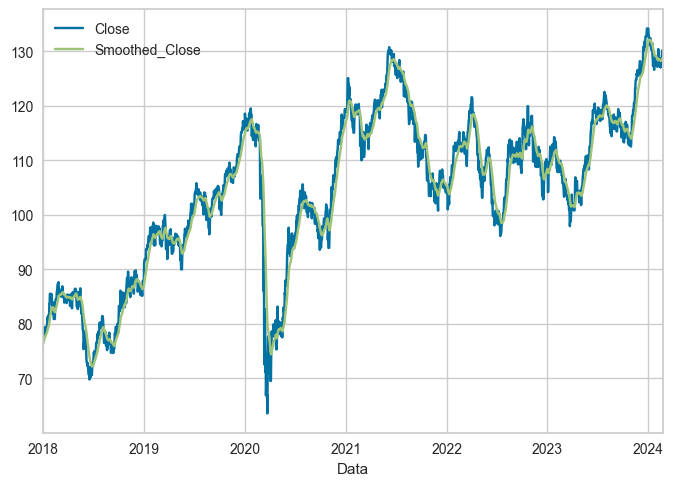

In [36]:
close_df[["Close", "Smoothed_Close"]].plot()


In [48]:
help(exp3.setup)


Help on method setup in module pycaret.time_series.forecasting.oop:

setup(data: Union[pandas.core.series.Series, pandas.core.frame.DataFrame] = None, data_func: Optional[Callable[[], Union[pandas.core.series.Series, pandas.core.frame.DataFrame]]] = None, target: Optional[str] = None, index: Optional[str] = None, ignore_features: Optional[List] = None, numeric_imputation_target: Union[str, int, float, NoneType] = None, numeric_imputation_exogenous: Union[str, int, float, NoneType] = None, transform_target: Optional[str] = None, transform_exogenous: Optional[str] = None, scale_target: Optional[str] = None, scale_exogenous: Optional[str] = None, fe_target_rr: Optional[list] = None, fe_exogenous: Optional[list] = None, fold_strategy: Union[str, Any] = 'expanding', fold: int = 3, fh: Union[List[int], int, numpy.ndarray, sktime.forecasting.base._fh.ForecastingHorizon, NoneType] = 1, hyperparameter_split: str = 'all', seasonal_period: Union[List[Union[int, str]], int, str, NoneType] = None, 

In [49]:
exp3 = TSForecastingExperiment()
fh = 15
fold = 5
fig_kwargs = {
    "rederer": "png",  # png ou svg
    "height": 600,  # altura da imagem
    "width": 1000,
    "template": "simple_white",
}

exp3.setup(
    data=close_df["Smoothed_Close"],
    fh=fh,
    session_id=42,
    fig_kwargs=fig_kwargs,
    use_gpu=True,
    fold=fold,
    seasonal_period="H",
)


,Description,Value
0,session_id,42
1,Target,Smoothed_Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(2245, 1)"
5,Transformed data shape,"(2245, 1)"
6,Transformed train set shape,"(2230, 1)"
7,Transformed test set shape,"(15, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3070 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there a

In [51]:
best = exp3.compare_models(n_select=5, sort="RMSE")


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,22:15:26
Status,. . . . . . . . . . . . . . . . . .,Fitting 5 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Auto ARIMA


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
arima,ARIMA,0.3465,0.2822,1.2519,1.4530,0.0097,0.0096,-5.3380,0.5320
naive,Naive Forecaster,0.4109,0.3275,1.4778,1.6841,0.0115,0.0115,-4.1519,0.0340
snaive,Seasonal Naive Forecaster,1.3831,0.9821,4.9690,5.0471,0.0388,0.0396,-63.7088,0.0500
polytrend,Polynomial Trend Forecaster,2.1073,1.4866,7.5992,7.6504,0.0587,0.0606,-203.7407,0.0140
grand_means,Grand Means Forecaster,7.0567,4.9455,25.4262,25.4412,0.1971,0.2188,-2295.6025,0.0200


Processing:   0%|          | 0/117 [00:00<?, ?it/s]

KeyboardInterrupt: 